# Notebook 02: Detecting Water Bodies with Spectral Indices

**Goal:** Use spectral indices (NDWI, MNDWI, NDVI, NDBI) to automatically detect water bodies, vegetation, and built-up areas in Bangalore.

**Why this matters:**
- Automated water body mapping without manual digitization
- Monitor lake shrinkage, encroachment, and pollution spread
- Separate water from built-up areas (a tricky problem in urban settings)
- Quantify changes in water surface area over time

**Author:** Dr. Sindhu | **Organization:** Smart Bhujal | **Contact:** sindhura@smartbhujal.com

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import rasterio
import sys, os

sys.path.insert(0, os.path.dirname(os.path.abspath(".")))
from utils import (
    compute_ndvi, compute_ndwi, compute_mndwi, compute_ndbi,
    extract_water_mask, compute_water_area_km2,
    make_rgb, normalize_band, plot_image, plot_comparison,
    plot_water_overlay, LAND_COVER_CLASSES, LAND_COVER_CMAP, LAND_COVER_LABELS
)

## Step 1: Load the 5-band image from Notebook 01

Loaded: 1683 x 2154 pixels (16.8 x 21.5 km)


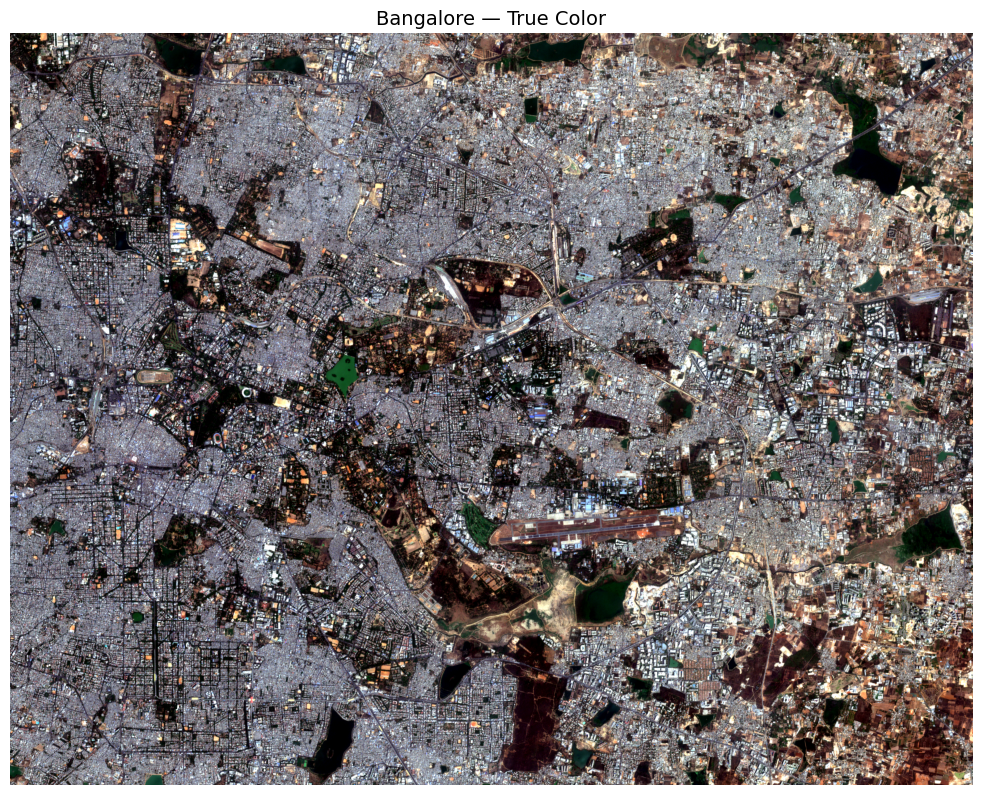

In [2]:
data_path = os.path.join("..", "data", "sample", "bangalore_5band.tif")

with rasterio.open(data_path) as src:
    blue = src.read(1)
    green = src.read(2)
    red = src.read(3)
    nir = src.read(4)
    swir = src.read(5)

rgb = make_rgb(red, green, blue)
print(f"Loaded: {red.shape[0]} x {red.shape[1]} pixels ({red.shape[0]*10/1000:.1f} x {red.shape[1]*10/1000:.1f} km)")
plot_image(rgb, title="Bangalore — True Color", figsize=(10, 8))
plt.show()

## Step 2: Spectral Indices for Water Resources

A spectral index combines two bands into a single number that highlights a specific feature. Three key indices:

| Index | Formula | What it detects | Range |
|-------|---------|-----------------|-------|
| **MNDWI** | (Green - SWIR) / (Green + SWIR) | **Water bodies** — best index for urban areas | -1 to +1, water > 0 |
| **NDVI** | (NIR - Red) / (NIR + Red) | **Vegetation health** — higher = greener | -1 to +1, vegetation > 0.3 |
| **NDBI** | (SWIR - NIR) / (SWIR + NIR) | **Built-up / impervious surfaces** | -1 to +1, built-up > 0 |

**Why MNDWI for water?** Water absorbs SWIR light almost completely but reflects green light. So for water pixels: Green is high, SWIR is near zero → MNDWI is strongly positive. For buildings: SWIR is high → MNDWI is negative. This makes it reliable even in dense urban areas like Bangalore.

In [3]:
mndwi = compute_mndwi(green, swir)
ndvi = compute_ndvi(nir, red)
ndbi = compute_ndbi(swir, nir)

print("Index statistics:")
for name, idx in [("MNDWI", mndwi), ("NDVI", ndvi), ("NDBI", ndbi)]:
    print(f"  {name}: min={idx.min():.2f}, max={idx.max():.2f}, mean={idx.mean():.3f}")

Index statistics:
  MNDWI: min=-0.70, max=0.56, mean=-0.213
  NDVI: min=-0.24, max=0.66, mean=0.156
  NDBI: min=-0.66, max=0.61, mean=0.027


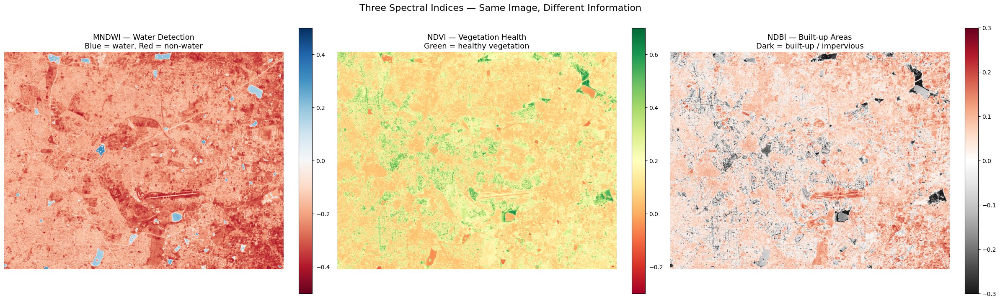

In [4]:
fig, axes = plt.subplots(1, 3, figsize=(24, 7))

im0 = axes[0].imshow(mndwi, cmap="RdBu", vmin=-0.5, vmax=0.5)
axes[0].set_title("MNDWI — Water Detection\nBlue = water, Red = non-water", fontsize=13)
axes[0].axis("off")
plt.colorbar(im0, ax=axes[0], fraction=0.046)

im1 = axes[1].imshow(ndvi, cmap="RdYlGn", vmin=-0.3, vmax=0.7)
axes[1].set_title("NDVI — Vegetation Health\nGreen = healthy vegetation", fontsize=13)
axes[1].axis("off")
plt.colorbar(im1, ax=axes[1], fraction=0.046)

im2 = axes[2].imshow(ndbi, cmap="RdGy_r", vmin=-0.3, vmax=0.3)
axes[2].set_title("NDBI — Built-up Areas\nDark = built-up / impervious", fontsize=13)
axes[2].axis("off")
plt.colorbar(im2, ax=axes[2], fraction=0.046)

plt.suptitle("Three Spectral Indices — Same Image, Different Information", fontsize=16, y=1.01)
plt.tight_layout()
plt.show()

## Step 3: What is Thresholding?

Thresholding is the **simplest image processing technique** — and one of the most useful.

The idea: every pixel has a numeric value (e.g., MNDWI = 0.35). We pick a **cutoff number** (the threshold). Pixels above it are one class, pixels below are another.

```
If pixel_value > threshold  →  Class A (e.g., water)
If pixel_value ≤ threshold  →  Class B (e.g., not water)
```

It's like setting a pass mark in an exam — everyone above passes, everyone below fails. The key question is: **where do you set the cutoff?**

To answer that, we look at the **histogram** — a chart showing how many pixels have each value.

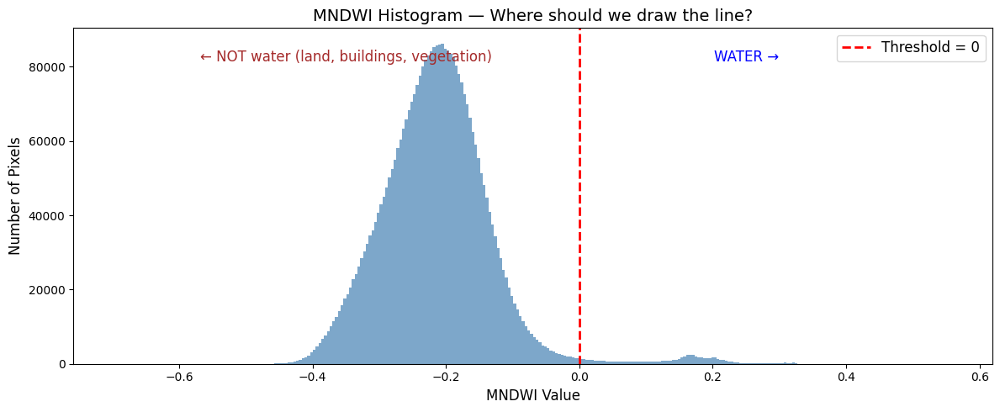

The histogram shows two groups of pixels:
  - A big peak on the LEFT (negative values) = land, buildings, vegetation
  - A small bump on the RIGHT (positive values) = water
  - The threshold at 0 sits between them — that's our cutoff!


In [5]:
# MNDWI histogram — where should we draw the line?
fig, ax = plt.subplots(figsize=(12, 5))

ax.hist(mndwi.flatten(), bins=300, color="steelblue", alpha=0.7, edgecolor="none")
ax.axvline(x=0, color="red", linestyle="--", linewidth=2, label="Threshold = 0")
ax.set_xlabel("MNDWI Value", fontsize=12)
ax.set_ylabel("Number of Pixels", fontsize=12)
ax.set_title("MNDWI Histogram — Where should we draw the line?", fontsize=14)
ax.legend(fontsize=12)
ax.annotate("← NOT water (land, buildings, vegetation)", xy=(-0.35, 0.9),
            fontsize=12, color="brown", xycoords=("data", "axes fraction"), ha="center")
ax.annotate("WATER →", xy=(0.25, 0.9),
            fontsize=12, color="blue", xycoords=("data", "axes fraction"), ha="center")

plt.tight_layout()
plt.show()

print("The histogram shows two groups of pixels:")
print("  - A big peak on the LEFT (negative values) = land, buildings, vegetation")
print("  - A small bump on the RIGHT (positive values) = water")
print("  - The threshold at 0 sits between them — that's our cutoff!")

### What happens when we apply the threshold?

Let's see the thresholding operation step by step on MNDWI. Every pixel with MNDWI > 0 becomes **white** (water), everything else becomes **black** (not water). This creates a **binary mask**.

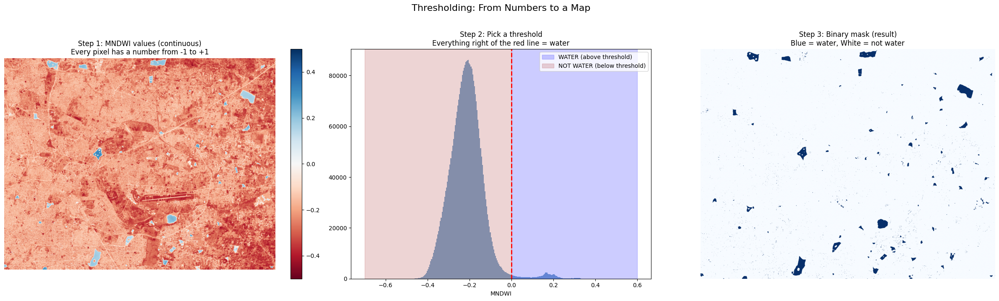

Result: 62,787 pixels classified as water = 6.28 km²


In [6]:
# Step by step: from continuous values → binary mask
threshold = 0.0
water_mask = (mndwi > threshold).astype(np.uint8)  # 1 = water, 0 = not water

fig, axes = plt.subplots(1, 3, figsize=(24, 7))

# 1. Original MNDWI (continuous values)
im = axes[0].imshow(mndwi, cmap="RdBu", vmin=-0.5, vmax=0.5)
axes[0].set_title("Step 1: MNDWI values (continuous)\nEvery pixel has a number from -1 to +1", fontsize=12)
axes[0].axis("off")
plt.colorbar(im, ax=axes[0], fraction=0.046)

# 2. Threshold line on the histogram (conceptual)
axes[1].hist(mndwi.flatten(), bins=300, color="steelblue", alpha=0.7, edgecolor="none")
axes[1].axvline(x=0, color="red", linestyle="--", linewidth=2)
axes[1].axvspan(0, 0.6, alpha=0.2, color="blue", label="WATER (above threshold)")
axes[1].axvspan(-0.7, 0, alpha=0.2, color="brown", label="NOT WATER (below threshold)")
axes[1].set_title("Step 2: Pick a threshold\nEverything right of the red line = water", fontsize=12)
axes[1].legend(fontsize=10)
axes[1].set_xlabel("MNDWI")

# 3. Binary mask result
axes[2].imshow(water_mask, cmap="Blues", vmin=0, vmax=1)
axes[2].set_title("Step 3: Binary mask (result)\nBlue = water, White = not water", fontsize=12)
axes[2].axis("off")

plt.suptitle("Thresholding: From Numbers to a Map", fontsize=16, y=1.02)
plt.tight_layout()
plt.show()

water_pixels = water_mask.sum()
water_area = water_pixels * (10**2) / 1e6
print(f"Result: {water_pixels:,} pixels classified as water = {water_area:.2f} km²")

### The threshold matters a LOT

Choosing the wrong threshold can drastically change results. Too low → false positives (shadows detected as water). Too high → misses small/shallow water bodies.

Let's see the effect of different thresholds on the same image:

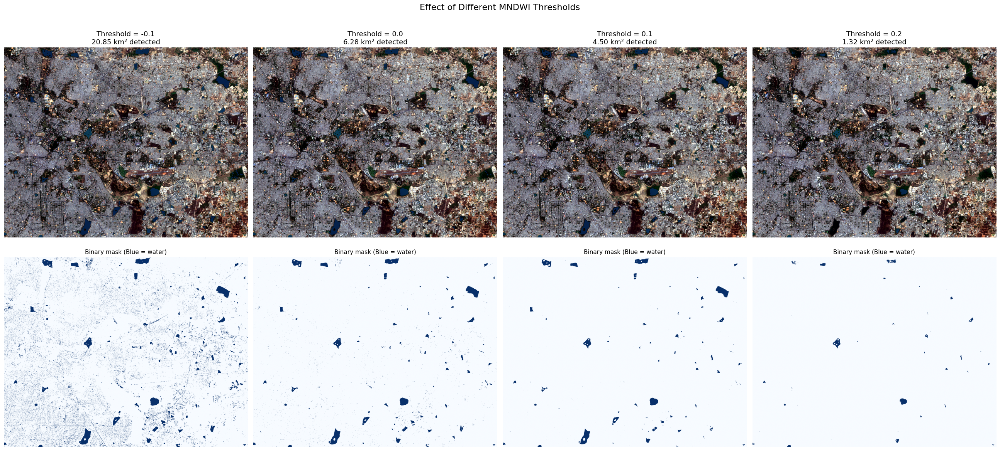

Observations:
  Threshold -0.1 (too low):  Detects shadows and wet soil as water — OVER-detection
  Threshold  0.0 (default):  Good balance for most cases
  Threshold  0.1 (higher):   Misses shallow/turbid water — UNDER-detection
  Threshold  0.2 (too high): Only detects deep, clear water bodies


In [7]:
# Compare different thresholds on MNDWI — overlay + binary mask side by side
thresholds = [-0.1, 0.0, 0.1, 0.2]

fig, axes = plt.subplots(2, 4, figsize=(26, 12))

for col, thresh in enumerate(thresholds):
    mask = (mndwi > thresh).astype(np.uint8)
    area = mask.sum() * 100 / 1e6

    # Top row: overlay on RGB
    axes[0, col].imshow(rgb)
    overlay = np.ma.masked_where(mask == 0, mask)
    axes[0, col].imshow(overlay, cmap="Blues", alpha=0.7, vmin=0, vmax=1)
    axes[0, col].set_title(f"Threshold = {thresh}\n{area:.2f} km² detected", fontsize=13)
    axes[0, col].axis("off")

    # Bottom row: binary mask
    axes[1, col].imshow(mask, cmap="Blues", vmin=0, vmax=1)
    axes[1, col].set_title(f"Binary mask (Blue = water)", fontsize=11)
    axes[1, col].axis("off")

axes[0, 0].set_ylabel("Overlay on RGB", fontsize=13)
axes[1, 0].set_ylabel("Binary mask", fontsize=13)

plt.suptitle("Effect of Different MNDWI Thresholds", fontsize=16, y=1.01)
plt.tight_layout()
plt.show()

print("Observations:")
print("  Threshold -0.1 (too low):  Detects shadows and wet soil as water — OVER-detection")
print("  Threshold  0.0 (default):  Good balance for most cases")
print("  Threshold  0.1 (higher):   Misses shallow/turbid water — UNDER-detection")
print("  Threshold  0.2 (too high): Only detects deep, clear water bodies")

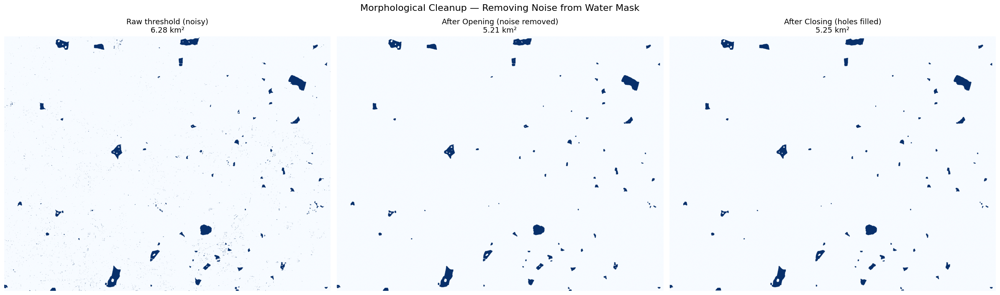

Raw mask:        62,787 water pixels
After opening:   52,132 water pixels (noise removed)
After closing:   52,461 water pixels (holes filled)


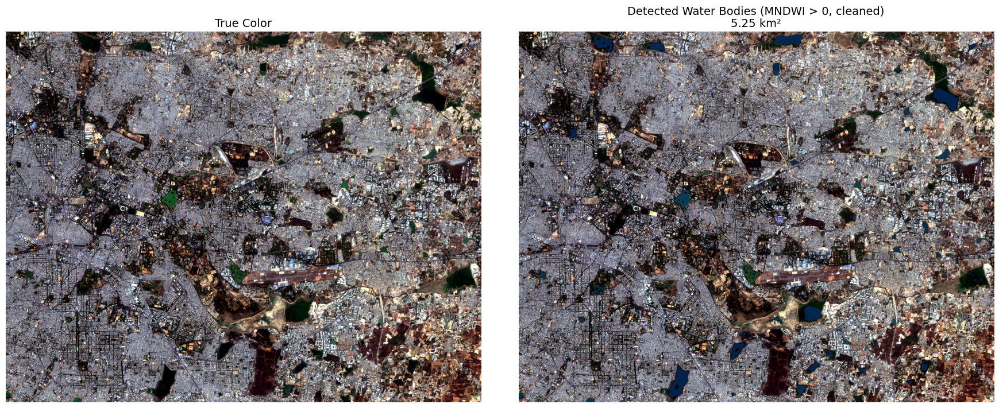

In [8]:
from scipy.ndimage import binary_opening, binary_closing

# Start with MNDWI > 0 mask
raw_mask = (mndwi > 0.0).astype(np.uint8)

# Opening: remove small noise (isolated pixels)
opened_mask = binary_opening(raw_mask, structure=np.ones((3, 3)), iterations=2).astype(np.uint8)

# Closing: fill small holes inside water bodies
cleaned_mask = binary_closing(opened_mask, structure=np.ones((3, 3)), iterations=2).astype(np.uint8)

fig, axes = plt.subplots(1, 3, figsize=(24, 7))

axes[0].imshow(raw_mask, cmap="Blues")
raw_area = raw_mask.sum() * 100 / 1e6
axes[0].set_title(f"Raw threshold (noisy)\n{raw_area:.2f} km²", fontsize=13)
axes[0].axis("off")

axes[1].imshow(opened_mask, cmap="Blues")
opened_area = opened_mask.sum() * 100 / 1e6
axes[1].set_title(f"After Opening (noise removed)\n{opened_area:.2f} km²", fontsize=13)
axes[1].axis("off")

axes[2].imshow(cleaned_mask, cmap="Blues")
cleaned_area = cleaned_mask.sum() * 100 / 1e6
axes[2].set_title(f"After Closing (holes filled)\n{cleaned_area:.2f} km²", fontsize=13)
axes[2].axis("off")

plt.suptitle("Morphological Cleanup — Removing Noise from Water Mask", fontsize=16, y=1.02)
plt.tight_layout()
plt.show()

print(f"Raw mask:      {raw_mask.sum():>8,} water pixels")
print(f"After opening: {opened_mask.sum():>8,} water pixels (noise removed)")
print(f"After closing: {cleaned_mask.sum():>8,} water pixels (holes filled)")

# Show the cleaned water mask overlaid on RGB
fig, axes = plt.subplots(1, 2, figsize=(18, 7))
axes[0].imshow(rgb)
axes[0].set_title("True Color", fontsize=14)
axes[0].axis("off")

axes[1].imshow(rgb)
overlay = np.ma.masked_where(cleaned_mask == 0, cleaned_mask)
axes[1].imshow(overlay, cmap="Blues", alpha=0.7, vmin=0, vmax=1)
water_area = cleaned_mask.sum() * 100 / 1e6
axes[1].set_title(f"Detected Water Bodies (MNDWI > 0, cleaned)\n{water_area:.2f} km²", fontsize=14)
axes[1].axis("off")
plt.tight_layout()
plt.show()

## Step 4: Threshold-based Land Cover Classification

Combine all indices to classify every pixel:

| Rule | Class |
|------|-------|
| MNDWI > 0 | Water |
| NDVI > 0.3 | Vegetation |
| NDBI > 0 and NDVI < 0.2 | Built-up |
| Everything else | Bare Soil |

Land cover breakdown:
  Water       :     62,787 pixels (  1.7%) = 6.28 km²
  Vegetation  :    426,636 pixels ( 11.8%) = 42.66 km²
  Bare Soil   :    856,671 pixels ( 23.6%) = 85.67 km²
  Built-up    :  2,279,088 pixels ( 62.9%) = 227.91 km²


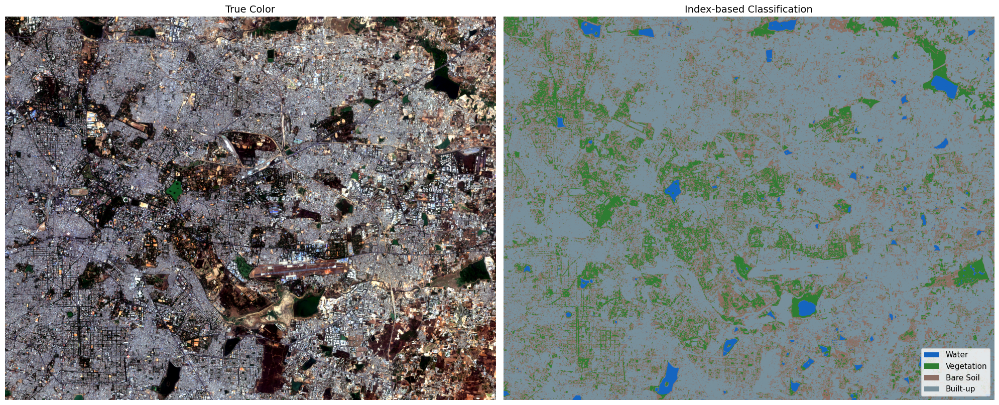

In [9]:
from matplotlib.colors import ListedColormap

# Threshold classification using multiple indices
classification = np.full_like(ndvi, 2, dtype=np.int32)  # Default: bare soil

classification[mndwi > 0] = 0                                    # Water
classification[(ndvi > 0.3) & (mndwi <= 0)] = 1                  # Vegetation
classification[(ndbi > 0) & (ndvi < 0.2) & (mndwi <= 0)] = 3    # Built-up

# Stats
print("Land cover breakdown:")
for class_id, (name, color) in LAND_COVER_CLASSES.items():
    count = (classification == class_id).sum()
    area_km2 = count * (10**2) / 1e6
    pct = count / classification.size * 100
    print(f"  {name:12s}: {count:>10,} pixels ({pct:5.1f}%) = {area_km2:.2f} km²")

# Visualize
fig, axes = plt.subplots(1, 2, figsize=(20, 8))

axes[0].imshow(rgb)
axes[0].set_title("True Color", fontsize=14)
axes[0].axis("off")

axes[1].imshow(classification, cmap=LAND_COVER_CMAP, vmin=0, vmax=3)
axes[1].set_title("Index-based Classification", fontsize=14)
axes[1].axis("off")

patches = [plt.Rectangle((0, 0), 1, 1, fc=c) for _, (_, c) in LAND_COVER_CLASSES.items()]
axes[1].legend(patches, LAND_COVER_LABELS, loc="lower right", fontsize=11)

plt.tight_layout()
plt.show()

## Step 5: Limitations of Index-based Methods

This approach is fast and intuitive, but has real problems:
- **Building shadows** can be misclassified as water (low reflectance)
- **Turbid/polluted water** may not trigger NDWI thresholds (think Bellandur lake foam!)
- **Single thresholds** don't adapt across different images or seasons
- **No spatial context** — each pixel is classified independently

This motivates **machine learning**: let the algorithm learn the complex boundaries between classes from data.

In [10]:
os.makedirs(os.path.join("..", "precomputed"), exist_ok=True)
np.save(os.path.join("..", "precomputed", "mndwi.npy"), mndwi)
np.save(os.path.join("..", "precomputed", "ndvi.npy"), ndvi)
np.save(os.path.join("..", "precomputed", "ndbi.npy"), ndbi)
np.save(os.path.join("..", "precomputed", "threshold_classification.npy"), classification)
np.save(os.path.join("..", "precomputed", "rgb.npy"), rgb)
print("Saved indices and classification for later notebooks.")

Saved indices and classification for later notebooks.


## Key Takeaways

1. **Spectral indices** turn multi-band imagery into single-number maps that highlight specific features
2. **MNDWI** is the best index for water detection in urban areas — uses Green and SWIR bands
3. **Thresholding** is the simplest classification: pick a cutoff, everything above is one class
4. **Threshold choice matters** — too low = false positives, too high = missed water bodies
5. **Morphological operations** (opening/closing) clean up noisy masks
6. **Combining indices** gives a quick land cover map, but has limitations with shadows and mixed pixels
7. For more accurate mapping, we need **machine learning** — next notebook

**Next:** In Notebook 03, we train ML models (Random Forest + U-Net) to classify land cover more accurately.